In [1]:
import types
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt 
import matplotlib.cm as cm
import plotly as py
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import warnings
import os


# se erros com importação execute no prompt $ pip install <Nome da importação>

In [2]:

path = r'/home/alefe/Workspace/Data-Mining/Imports/bess-bms.csv'
data = pd.read_csv(path,sep=';')

data.head()

,Timestamp,Id,BmsStatus,BmsInformation,GlobalBattery_Voltage,GlobalBattery_Current,GlobalBattery_Soc,GlobalBattery_Soh,GlobalBattery_Statistic_VoltageMean,GlobalBattery_Statistic_VoltageMax,...,Bstring2_Bmu_Temperature_281,Bstring2_Bmu_Temperature_282,Bstring2_Bmu_Temperature_283,Bstring2_Bmu_Temperature_284,Bstring2_Bmu_Temperature_285,Bstring2_Bmu_Temperature_286,Bstring2_Bmu_Temperature_287,Bstring2_Status,Energy_Charge,Energy_Discharge
0,2020-09-01T16:49:41,NaN,Status Normal,Normal,605.70,3.2,95.0,99,2.13,2.22,...,0,0,0,23,0,0,0,True,37,689
1,2020-09-01T16:49:42,NaN,Status Normal,Normal,605.75,3.2,95.0,99,2.13,2.22,...,0,0,0,23,0,0,0,True,37,689
2,2020-09-01T16:49:43,NaN,Status Normal,Normal,605.75,3.2,95.0,99,2.13,2.22,...,0,0,0,23,0,0,0,True,37,689
3,2020-09-01T16:49:44,NaN,Status Normal,Normal,605.75,3.2,95.0,99,2.13,2.22,...,0,0,0,23,0,0,0,True,37,689
4,2020-09-01T16:49:45,NaN,Status Normal,Normal,605.70,3.2,95.0,99,2.13,2.22,...,0,0,0,23,0,0,0,True,37,689


In [3]:
# Calculo mediana temperatura e tensão
def getNameColumns(column, qtsColumns):
    columns = []
    for x in range(qtsColumns + 1):
        columns.append(column + str(x))
    return columns
data_voltage = data[getNameColumns('Bstring1_Bmu_Voltage_',287)]
data_temperature = data[getNameColumns('Bstring1_Bmu_Temperature_',287)]

# remover colunas com valores vazios (Temperatura)
data_temperature  = data_temperature.drop(data_temperature.columns[data_temperature.apply(lambda col: col.sum() == 0)], axis=1)

data_voltage = data_voltage.median(axis = 1)
data_voltage = {
    'VoltageMedian': data_voltage
}

data_temperature = data_temperature.median(axis = 1)
data_temperature = {
    'TemperatureMedian': data_temperature
}


TemperatureMedian = pd.DataFrame(data_temperature) 
VoltageMedian = pd.DataFrame(data_voltage) 

data['TemperatureMedian'] = TemperatureMedian 
data['VoltageMedian'] = VoltageMedian
data.describe()

,Id,GlobalBattery_Voltage,GlobalBattery_Current,GlobalBattery_Soc,GlobalBattery_Soh,GlobalBattery_Statistic_VoltageMean,GlobalBattery_Statistic_VoltageMax,GlobalBattery_Statistic_VoltageArgmax,GlobalBattery_Statistic_VoltageMin,GlobalBattery_Statistic_VoltageArgmin,...,Bstring2_Bmu_Temperature_282,Bstring2_Bmu_Temperature_283,Bstring2_Bmu_Temperature_284,Bstring2_Bmu_Temperature_285,Bstring2_Bmu_Temperature_286,Bstring2_Bmu_Temperature_287,Energy_Charge,Energy_Discharge,TemperatureMedian,VoltageMedian
count,0.0,23939.000000,23939.000000,23939.000000,23939.0,23939.000000,23939.000000,23939.000000,23939.000000,23939.000000,...,23939.0,23939.0,23939.000000,23939.0,23939.0,23939.0,23939.000000,23939.000000,23939.000000,23939.000000
mean,NaN,595.697146,11.527457,63.672653,99.0,2.096766,2.159157,385.438657,2.078124,431.791595,...,0.0,0.0,23.238941,0.0,0.0,0.0,264.453611,461.543506,24.127741,2.129290
std,NaN,31.244031,136.682005,15.672003,0.0,0.109933,0.112952,68.002700,0.122153,183.682084,...,0.0,0.0,0.426445,0.0,0.0,0.0,114.560661,114.562521,0.485217,0.112417
min,NaN,556.340000,-161.390000,39.500000,99.0,1.960000,2.010000,46.000000,1.910000,20.000000,...,0.0,0.0,23.000000,0.0,0.0,0.0,37.000000,287.000000,23.000000,1.990000
25%,NaN,567.400000,-131.900000,50.650000,99.0,2.000000,2.060000,406.000000,1.970000,518.000000,...,0.0,0.0,23.000000,0.0,0.0,0.0,194.000000,364.000000,24.000000,2.030000
50%,NaN,602.950000,3.500000,62.150000,99.0,2.120000,2.180000,406.000000,2.080000,518.000000,...,0.0,0.0,23.000000,0.0,0.0,0.0,276.000000,450.000000,24.000000,2.160000
75%,NaN,622.300000,138.890000,73.590000,99.0,2.190000,2.250000,406.000000,2.190000,518.000000,...,0.0,0.0,23.000000,0.0,0.0,0.0,362.000000,532.000000,24.000000,2.230000
max,NaN,679.300000,219.200000,95.000000,99.0,2.390000,2.560000,406.000000,2.360000,565.000000,...,0.0,0.0,24.000000,0.0,0.0,0.0,439.000000,689.000000,25.000000,2.430000


In [4]:

# Colunas da string 1
Bstring_1 = ['Bstring1_Battery_Voltage', 'Bstring1_Battery_Current', 'Bstring1_Battery_Soc', 'TemperatureMedian', 'VoltageMedian']

data = data[Bstring_1]

In [43]:
variables = ['Bstring1_Battery_Soc', 'Bstring1_Battery_Current']

X1 = data[variables].iloc[: , :].values
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n))
    algorithm.fit(X1)
    inertia.append(algorithm.inertia_)

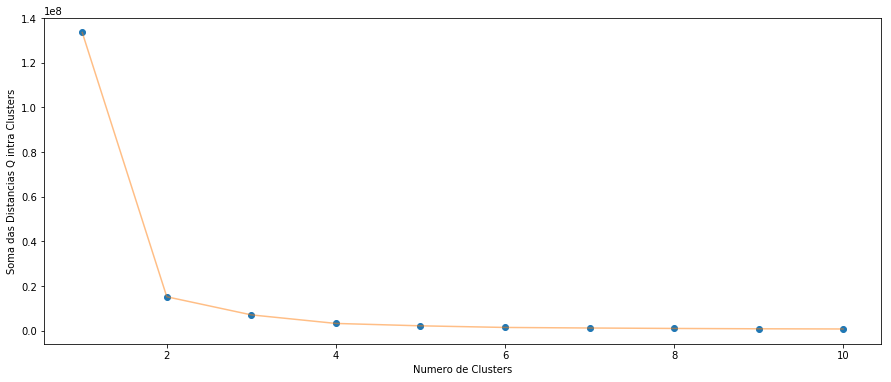

In [44]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Numero de Clusters') , plt.ylabel('Soma das Distancias Q intra Clusters')
plt.show()

In [45]:
# indique a quantidade de clusters desejada
clusters_number=2

algorithm = (KMeans(n_clusters =clusters_number ))
algorithm.fit(X1)

# Saída:

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=24000,
       n_clusters=clusters_number, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=24000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

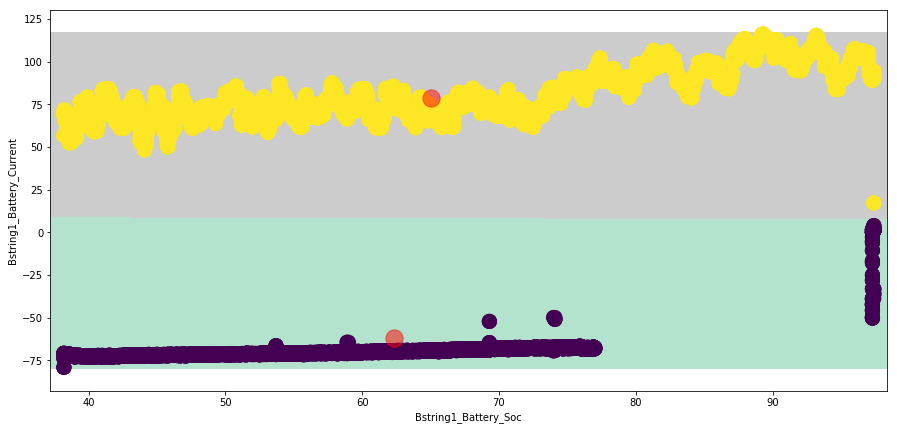

In [46]:
labels2 = algorithm.labels_
centroids2 = algorithm.cluster_centers_

h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 

plt.figure(1 , figsize = (15 , 7) )
plt.clf()
Z2 = Z.reshape(xx.shape)
plt.imshow(Z2 , interpolation='nearest', extent=(xx.min(), xx.max(), yy.min(), yy.max()), cmap = plt.cm.Pastel2, aspect = 'auto', origin='lower')
plt.scatter( x = variables[0] ,y = variables[1] , data = data , c = labels2 , s = 200 )
plt.scatter(x = centroids2[: , 0] , y =  centroids2[: , 1] , s = 300 , c = 'red' , alpha = 0.5)
plt.ylabel(variables[1]) , plt.xlabel(variables[0])
plt.show()

In [47]:
data['clusters'] = algorithm.labels_
columns = variables + ['clusters']
df_group = data[columns].groupby("clusters")
df_group.describe()

Bstring1_Battery_Soc                                           \
                        count       mean        std   min    25%   50%   
clusters                                                                 
0                     12269.0  62.314197  16.483037  38.2  49.29  60.5   
1                     11670.0  65.014437  16.857166  38.2  50.29  63.9   

                        Bstring1_Battery_Current                               \
              75%   max                    count       mean        std    min   
clusters                                                                        
0         71.1900  97.4                  12269.0 -62.152020  22.573139 -79.09   
1         78.7725  97.4                  11670.0  78.546071  13.867132  17.20   

                                    
           25%    50%   75%    max  
clusters                            
0        -71.5 -70.09 -68.0    3.9  
1         68.5  74.70  86.8  116.2

('For n_clusters =', 2, 'The average silhouette_score is :', 0.7990333746141989)
('For n_clusters =', 3, 'The average silhouette_score is :', 0.7782708127590192)
('For n_clusters =', 4, 'The average silhouette_score is :', 0.7264226575128798)


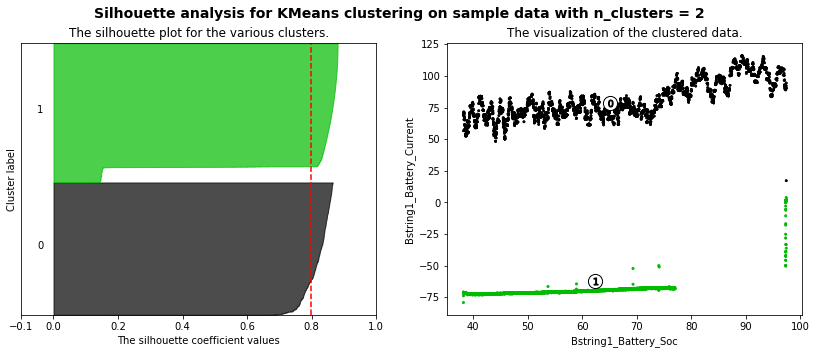

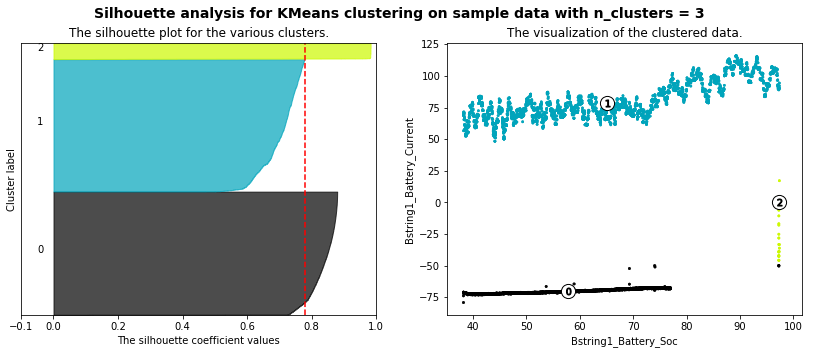

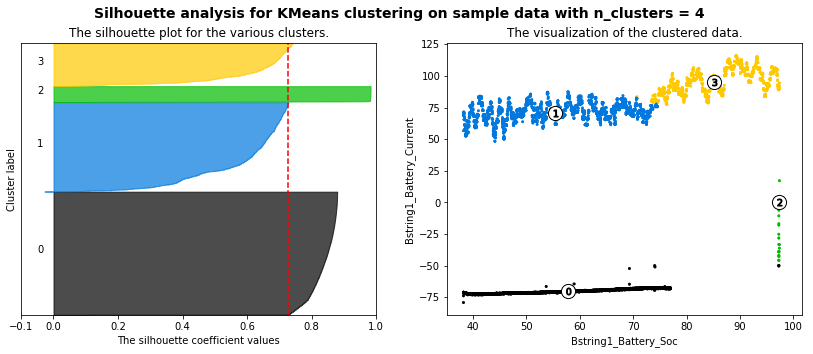

In [48]:

range_n_clusters = [2, 3, 4]

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14, 5)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X1) + (n_clusters + 1) * 10])
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X1)
    silhouette_avg = silhouette_score(X1, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    sample_silhouette_values = silhouette_samples(X1, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10 

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([]) 
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X1[:, 0], X1[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel(variables[0])
    ax2.set_ylabel(variables[1])

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()